In [1]:
from functions import *
from embed_functions import *

# print full arrays/dataframes for debugging
# np.set_printoptions(threshold=sys.maxsize)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Import filepaths
datacode, filepaths_raw = import_ima()
print("Number of filepaths before filtering:{}".format(len(filepaths_raw)))

# Remove all filepaths involved in TP quotes
filepaths = process_filepaths(filepaths_raw)
print("Number of filepaths after filtering:{}".format(len(filepaths)))

df = pd.DataFrame()
df["filepaths"] = filepaths

dim_size=300

Using TensorFlow backend.


./ima/20200116.dat
importing next...
./ima/20200117.dat
importing next...
./ima/20200118.dat
importing next...
./ima/20200119.dat
importing next...
./ima/20200215.dat
importing next...
All IMA measurements in ./ima/ imported successfully.
Number of filepaths before filtering:57423
Number of filepaths after filtering:22527


In [2]:
ft_model, encoded_fps = do_fasttext(filepaths, dim_size=dim_size, epochs=200)

building 300 dimensional FastText model for 200 epochs...
FastText model trained!
calculating sentence embedding via BOW...
sentence vectors embedded.


Explained variation per principal component:[0.35951657 0.21359865 0.09919331]
showing plot...


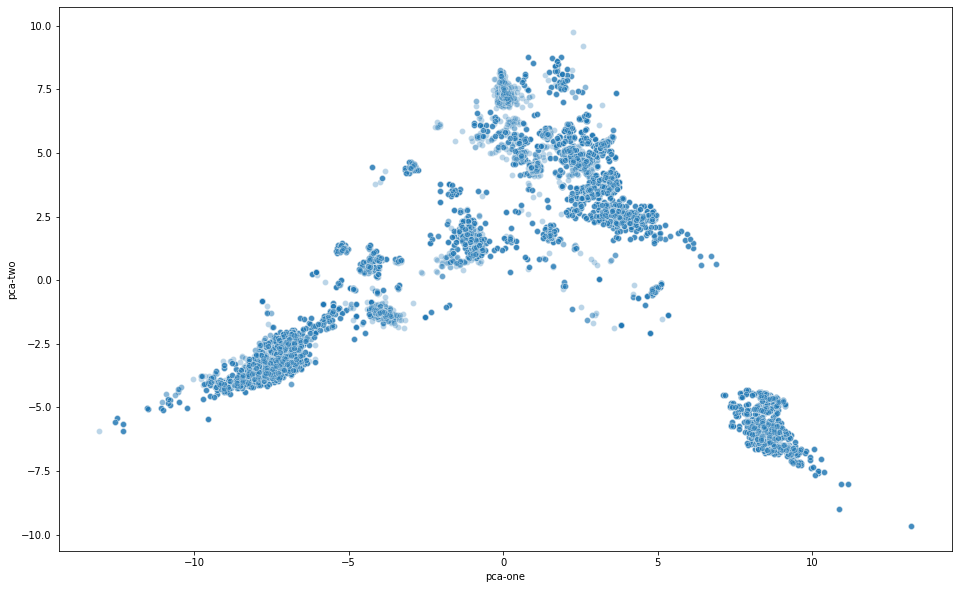

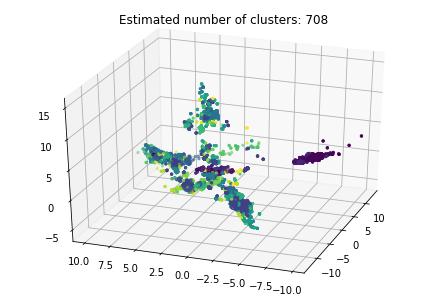

number of cluster found: 708
cluster for each point:  [  0   1   2 ... 168 579 578]


,filepaths,cluster
0,"[opt, certbot, certbot-auto]",0.0
7514,"[opt, certbot, certbot-auto]",0.0
11655,"[opt, certbot, certbot-auto]",0.0
15237,"[opt, certbot, certbot-auto]",0.0
18886,"[opt, certbot, certbot-auto]",0.0
14976,"[usr, bin, test]",1.0
20259,"[usr, bin, mysqldump]",1.0
11385,"[usr, bin, test]",1.0
9072,"[usr, bin, mysqldump]",1.0
7515,"[usr, bin, id]",1.0


In [3]:
data_pca = func_pca(datanp=encoded_fps, feat_cols=range(1, dim_size+1), drawplot=1, n_components=3)
data_pca_clustered = func_dbscan(data=data_pca[:, [-3,-2,-1]],
                        eps=0.2,
                        min_samples=2,
                        drawplot=1)
feat_cols = []
feat_cols.append("filepaths")
explore_cluster(datanp=filepaths, 
                dataclust=data_pca_clustered,
                cols=feat_cols,
                filepaths=filepaths
               )

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 22527 samples in 1.345s...
[t-SNE] Computed neighbors for 22527 samples in 26.547s...
[t-SNE] Computed conditional probabilities for sample 1000 / 22527
[t-SNE] Computed conditional probabilities for sample 2000 / 22527
[t-SNE] Computed conditional probabilities for sample 3000 / 22527
[t-SNE] Computed conditional probabilities for sample 4000 / 22527
[t-SNE] Computed conditional probabilities for sample 5000 / 22527
[t-SNE] Computed conditional probabilities for sample 6000 / 22527
[t-SNE] Computed conditional probabilities for sample 7000 / 22527
[t-SNE] Computed conditional probabilities for sample 8000 / 22527
[t-SNE] Computed conditional probabilities for sample 9000 / 22527
[t-SNE] Computed conditional probabilities for sample 10000 / 22527
[t-SNE] Computed conditional probabilities for sample 11000 / 22527
[t-SNE] Computed conditional probabilities for sample 12000 / 22527
[t-SNE] Computed conditional probabilities for s

<Figure size 1152x720 with 0 Axes>

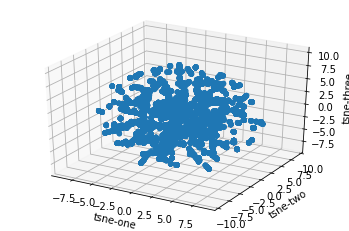

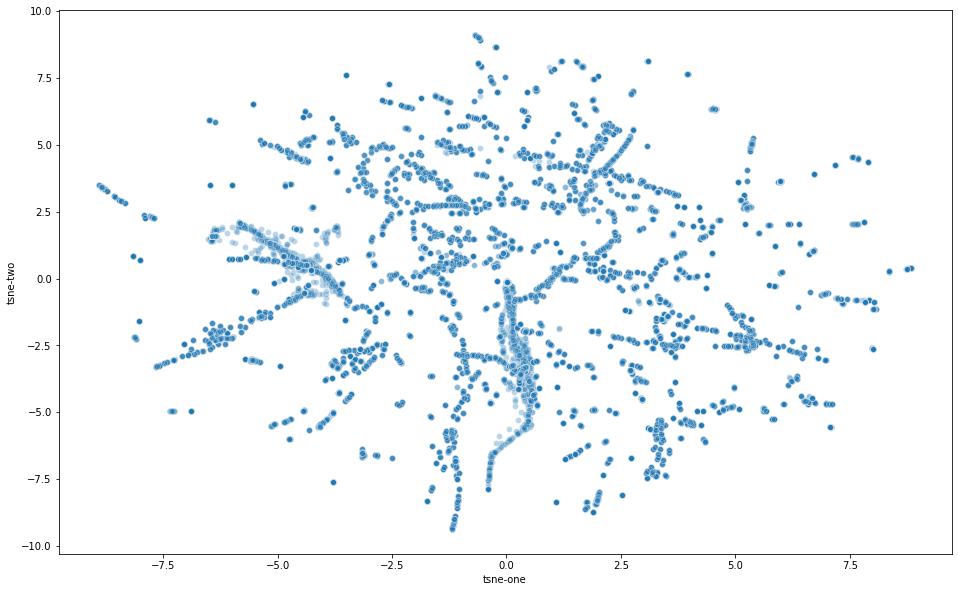

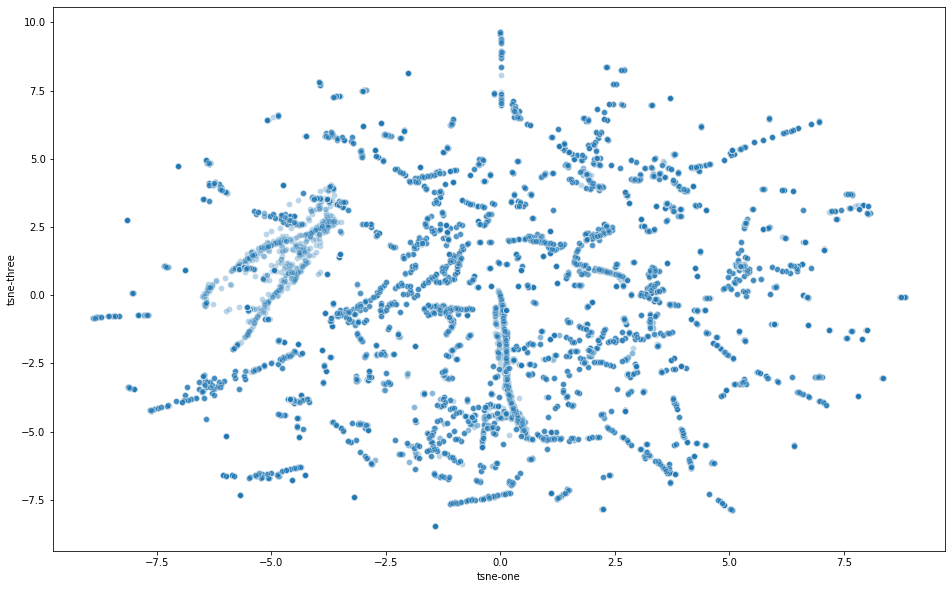

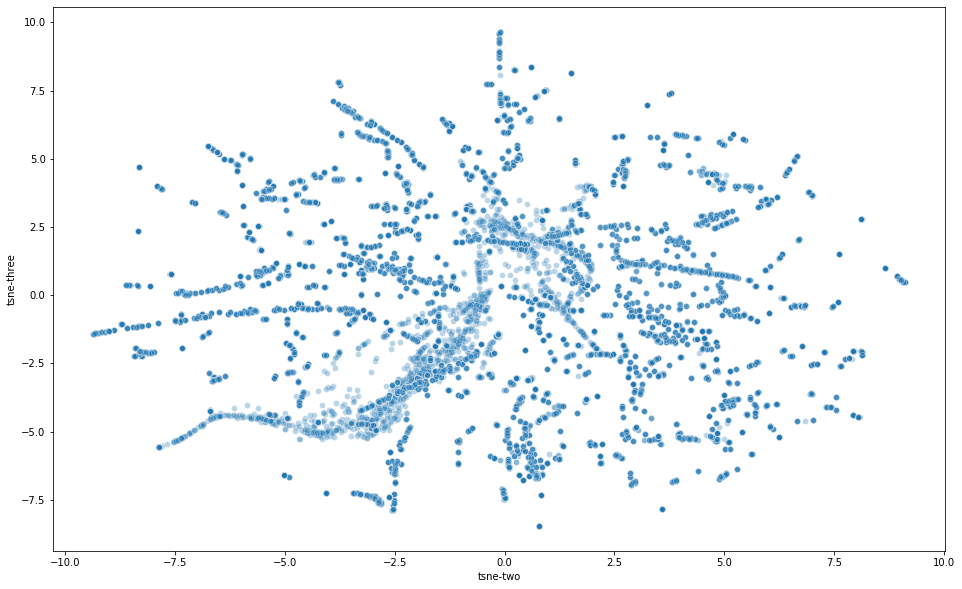

showing  tsne  plot...


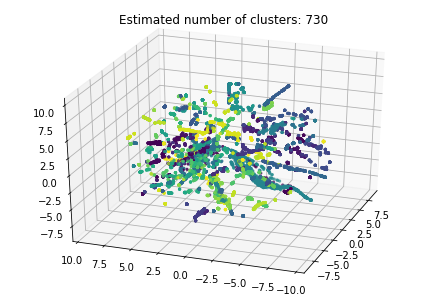

number of cluster found: 731
cluster for each point:  [  0   1   2 ...   1 197 680]


,filepaths,cluster
2169,"[var, lib, dpkg, info, locales.list]",-1.0
2076,"[var, lib, dpkg, info, vim-runtime.list]",-1.0
2034,"[var, lib, dpkg, info, openssl.list]",-1.0
2030,"[var, lib, dpkg, info, cryptsetup-bin.list]",-1.0
2020,"[var, lib, dpkg, info, systemd.list]",-1.0
2011,"[var, lib, dpkg, info, php-common.list]",-1.0
1978,"[var, lib, dpkg, info, libperl5.26:amd64.list]",-1.0
1912,"[var, lib, dpkg, info, ldap-utils.list]",-1.0
1887,"[var, lib, dpkg, info, libmagic1:amd64.list]",-1.0
1756,"[var, lib, dpkg, info, libhcrypto4-heimdal:amd64.list]",-1.0


In [4]:
data_tsne = func_tsne(datanp=encoded_fps, feat_cols=range(1,dim_size+1), drawplot=1, n_components=3)
data_tsne_clustered = func_dbscan(data=data_tsne[:, [-3,-2,-1]],
                        eps=0.2,
                        min_samples=2,
                        drawplot=1)
explore_cluster(datanp=filepaths, 
                dataclust=data_tsne_clustered,
                cols=feat_cols,
                filepaths=filepaths
               )

C:\Users\root01\Anaconda3\envs\fouryp\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\Anaconda3\envs\fouryp\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
C:\Users\root01\Anaconda3\envs\fouryp\lib\site-packages\numba\typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\Anaconda3\envs\fouryp\lib\site-packages\um

UMAP done! Time elapsed: 69.17622756958008 seconds
umap done in 3 dimensions


<Figure size 1152x720 with 0 Axes>

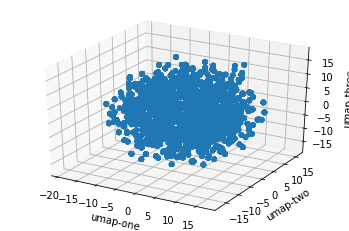

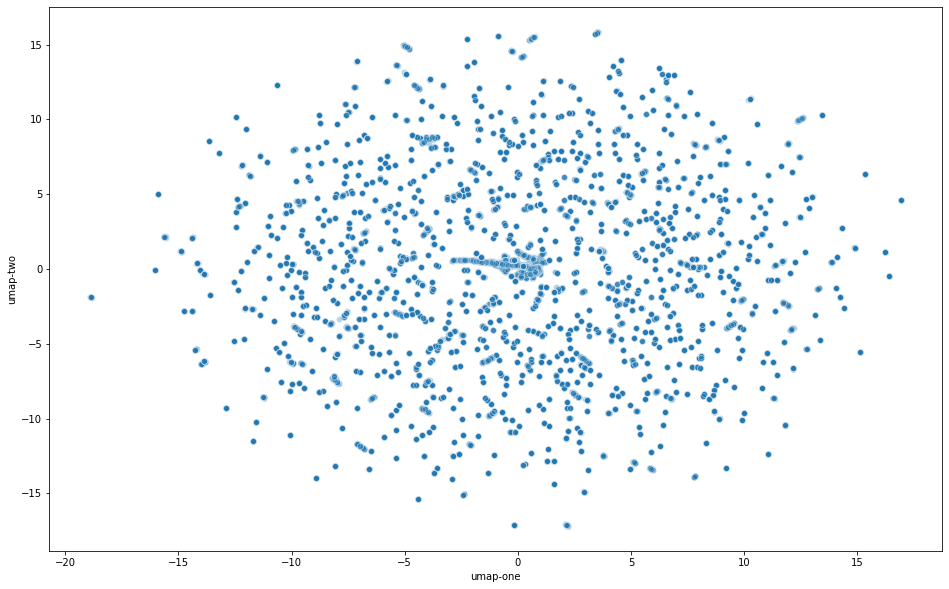

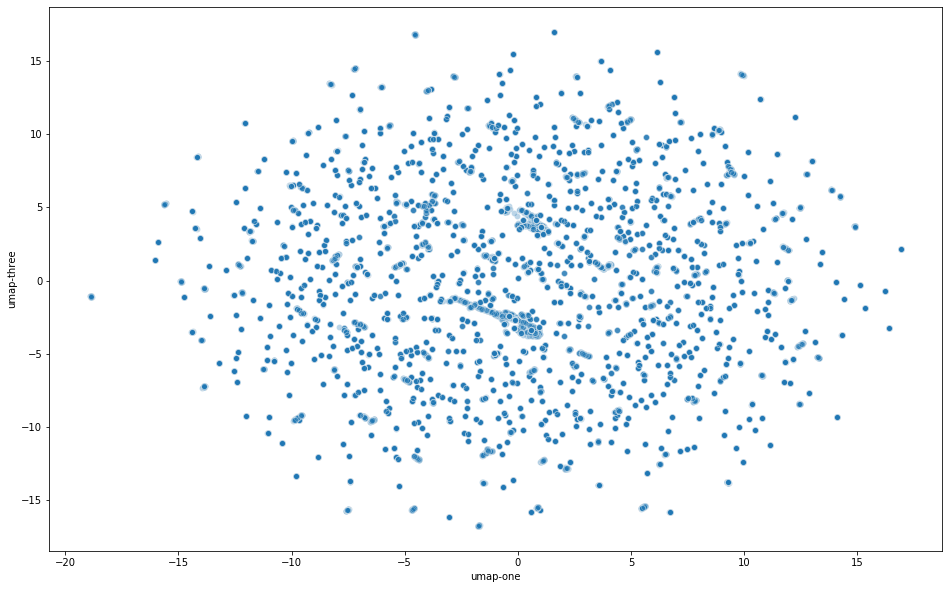

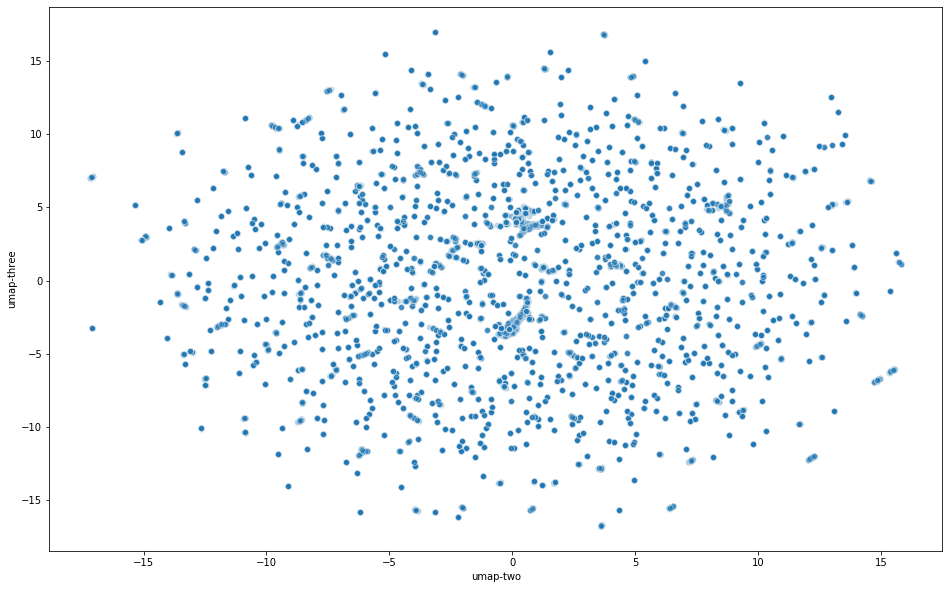

showing  umap  plot...


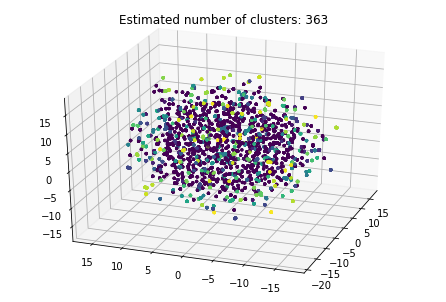

number of cluster found: 364
cluster for each point:  [  0  -1   1 ...  95  89 336]


,filepaths,cluster
4437,"[var, www, html, nextcloud, apps, notifications, appinfo, app.php]",-1.0
5866,"[usr, lib, python3, dist-packages, asn1crypto, _perf, __pycache__, _big_num_ctypes.cpython-36.pyc]",-1.0
5865,"[usr, lib, python3, dist-packages, asn1crypto, _perf, __pycache__, __init__.cpython-36.pyc]",-1.0
10984,"[usr, lib, python3.6, encodings, __pycache__, latin_1.cpython-36.pyc]",-1.0
5863,"[usr, lib, python3, dist-packages, asn1crypto, __pycache__, _ordereddict.cpython-36.pyc]",-1.0
20210,"[var, lib, apt, lists, nyc2.mirrors.digitalocean.com_mariadb_repo_10.4_ubuntu_dists_bionic_main_binary-amd64_Packages]",-1.0
10989,"[var, www, html, nextcloud, core, l10n, en_GB.json]",-1.0
11000,"[usr, lib, python3.6, collections, __pycache__, __init__.cpython-36.pyc]",-1.0
11001,"[var, www, html, nextcloud, apps, files, l10n, en_GB.json]",-1.0
11011,"[usr, lib, python3.6, collections, __pycache__, abc.cpython-36.pyc]",-1.0


In [12]:
data_umap = func_umap(datanp=encoded_fps, feat_cols=range(1,dim_size+1), drawplot=1, n_components=3)
data_umap_clustered = func_dbscan(data=data_umap[:, [-3,-2,-1]],
                        eps=0.2,
                        min_samples=2,
                        drawplot=1)
explore_cluster(datanp=filepaths, 
                dataclust=data_umap_clustered,
                cols=feat_cols,
                filepaths=filepaths
               )

In [18]:
from eval_functions import *
fp_df = generate_new_filepath(filepaths, data_pca_clustered)

ValueError: Length of values does not match length of index

In [ ]:

new_line_vec = infer_new_fasttext_vector(new_line, ft_model)     # infer its vector using the same model trained earlier


IndexError: list index out of range

FileNotFoundError: [Errno 2] No such file or directory: ''

<class 'numpy.ndarray'>
